In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import matplotlib.pyplot as plt

import rasterio.plot
import rasterio.mask
import shapely.geometry

import uncertainties as unp
from uncertainties import unumpy 

import scipy.optimize

import copy
import importlib
import cratools

importlib.reload(cratools)

#dictionary keys to simplify switching between datasets
# check geometry buffer - is it stored as radius or diameter
# key : [name, dem, image]
regions = {'faustini': ['faustini', 'SHADOWCAM_FAUSTINI_P871S0839.tif', 'SHADOWCAM_FAUSTINI_M017670865SE_170cm.tif'],
           'sverdrup': ['sverdrup', 'SHADOWCAM_SVERDRUP.tif', 'SHADOWCAM_SVERDRUP_M016815246SE_210cm.tif'],
           'test': ['tmp.test_craters', 'SHADOWCAM_FAUSTINI_P871S0839.tif', 'SHADOWCAM_FAUSTINI_M017670865SE_170cm.tif'],
           'site1': ['yolo_site1', 'LDEM_80S_20MPP_ADJ.TIF', 'NAC_POLE_SOUTH_CM_AVG_P848S0337.TIF']
           }

#set the name of the region here
region, dem, orthophoto = regions['test']
min_D = 60

filename_dem_full = f"/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/images/{str(dem)}"
shapefile_path = f"/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/shapefiles/{str(region)}"
orthophoto_path = f"/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/images/{str(orthophoto)}"


In [ ]:
# produces a cleaned/refined crater dataset where the rims are adjusted using topography, and error terms are stored

def update_d_D(in_shp, out_shp, min_D = 60, dem = filename_dem_full):
    with rio.open(filename_dem_full, 'r') as src:
        #src.nodata = np.nan
        
        updated_craters = []
        UFID = []
        Diam_m = []
        davg = []
        old_dD = []
        rim_AJS = []
        fl_AJS = []
        err_x0 = []
        err_y0 = []
        err_r = []

        df_crater = gpd.read_file(in_shp)
        df_crater = df_crater.drop(df_crater[df_crater['D_m'] <= min_D].index)
        display(df_crater[0:])
        # print(df_crater['geometry'])
        crs = df_crater.crs
        for (idx,geom) in enumerate(df_crater['geometry']):


            radius = np.sqrt(geom.area / np.pi)
            diam = radius * 2

            if diam < min_D:
                continue
            
            out, err = cratools.fit_crater_rim(geom, 
                        src,
                        crs,
                        orthophoto_path,
                        inner_radius = 0.8,
                        outer_radius = 1.2, 
                        plot = True,
                        remove_ext = True)
            updated_craters.append(out)
            UFID.append(df_crater['UFID'].iloc[idx])
            Diam_m.append(df_crater['D_m'].iloc[idx])
            davg.append(df_crater['davg'].iloc[idx])
            old_dD.append(df_crater['davg_D'].iloc[idx])
            rim_AJS.append(df_crater['rim'].iloc[idx])
            fl_AJS.append(df_crater['fl'].iloc[idx])

            err_x0.append(err[0])
            err_y0.append(err[1])
            err_r.append(err[2])


        gdf_crater_new = gpd.GeoDataFrame(index = range(len(updated_craters)), crs = crs, geometry = updated_craters)
        gdf_crater_new["UFID"] = UFID
        gdf_crater_new["Diam_m"] = Diam_m
        gdf_crater_new["davg"] = davg
        gdf_crater_new["old_dD"] = old_dD
        gdf_crater_new["rim_AJS"] = rim_AJS
        gdf_crater_new["fl_AJS"] = fl_AJS

        gdf_crater_new["err_x0"] = err_x0
        gdf_crater_new["err_y0"] = err_y0
        gdf_crater_new["err_r"] = err_r

        display(gdf_crater_new)

        with rio.open(filename_dem_full, 'r') as src:
            #src.nodata = np.nan
            fig, ax = plt.subplots()
            extent = [src.bounds[0], src.bounds[2], src.bounds[1], src.bounds[3]]
            ax = rasterio.plot.show(src, extent=extent, ax=ax, cmap="pink")

            gdf_crater_new.plot(ax = ax)

    gdf_crater_new.to_file(out_shp)

,FeatureID,UFID,lat,lon,x_km,y_km,Diam_km,zp_slope,rh,rv,...,rim_sd,scaled_sd,davg,dh_D,dv_D,davg_D,x_m,y_m,D_m,geometry
0,2322,p003c2322,-87.031491,84.372185,89.601294,8.829402,0.169115,0.312395,0,0,...,1.388385,0.160627,8.643539,0.047490,0.039034,0.051110,89601.29355,8829.402469,169.114867,"POLYGON ((89685.851 8829.402, 89685.444 8821.1..."
1,2323,p003c2323,-87.025907,84.669165,89.814575,8.380600,0.307717,0.512113,0,0,...,0.820674,0.062436,13.144318,0.040068,0.040385,0.042716,89814.57462,8380.600052,307.717374,"POLYGON ((89968.433 8380.6, 89967.692 8365.519..."
2,2324,p003c2324,-87.018277,84.798228,90.063783,8.199254,0.097500,0.371220,0,0,...,0.623705,0.199860,3.120705,0.026595,0.024169,0.032007,90063.78259,8199.254022,97.500408,"POLYGON ((90112.533 8199.254, 90112.298 8194.4..."
3,2325,p003c2325,-87.017817,84.881006,90.089445,8.070373,0.085654,1.673042,0,0,...,1.002604,0.280462,3.574827,0.027950,0.015512,0.041736,90089.44474,8070.372985,85.653549,"POLYGON ((90132.272 8070.373, 90132.065 8066.1..."
4,2326,p003c2326,-87.020458,85.012205,90.027856,7.857092,0.366794,0.317725,0,0,...,2.837936,0.132023,21.495814,0.042102,0.050280,0.058605,90027.85580,7857.092076,366.794230,"POLYGON ((90211.253 7857.092, 90210.37 7839.11..."
5,2327,p003c2327,-87.010664,85.141808,90.341504,7.678597,0.178570,1.390806,0,0,...,1.562300,0.209880,7.443768,0.035606,0.038748,0.041686,90341.50409,7678.597498,178.569540,"POLYGON ((90430.789 7678.597, 90430.359 7669.8..."
6,2328,p003c2328,-87.028220,85.047534,89.798037,7.781246,0.110246,0.919351,0,0,...,0.821546,0.192116,4.276311,0.030716,0.027191,0.038789,89798.03673,7781.246072,110.245561,"POLYGON ((89853.16 7781.246, 89852.894 7775.84..."
7,2344,p003c2344,-87.021429,84.162600,89.872138,9.188152,0.295913,0.205333,0,0,...,3.367043,0.195712,17.204033,0.050827,0.048170,0.058139,89872.13833,9188.152010,295.912638,"POLYGON ((90020.095 9188.152, 90019.382 9173.6..."
8,2349,p003c2349,-87.015285,84.382805,90.092316,8.860926,0.273877,0.524436,0,0,...,1.772265,0.241420,7.340993,0.014734,0.021901,0.026804,90092.31610,8860.926452,273.876881,"POLYGON ((90229.255 8860.926, 90228.595 8847.5..."
9,2446,p003c2446,-87.017082,83.516530,89.893878,10.215844,0.240926,1.378237,0,0,...,0.938838,0.167481,5.605634,0.014878,0.023839,0.023267,89893.87814,10215.843560,240.926053,"POLYGON ((90014.341 10215.844, 90013.761 10204..."


,FeatureID,UFID,lat,lon,x_km,y_km,Diam_km,zp_slope,rh,rv,...,rim_sd,scaled_sd,davg,dh_D,dv_D,davg_D,x_m,y_m,D_m,geometry
0,2322,p003c2322,-87.031491,84.372185,89.601294,8.829402,0.169115,0.312395,0,0,...,1.388385,0.160627,8.643539,0.047490,0.039034,0.051110,89601.29355,8829.402469,169.114867,"POLYGON ((89685.851 8829.402, 89685.444 8821.1..."
1,2323,p003c2323,-87.025907,84.669165,89.814575,8.380600,0.307717,0.512113,0,0,...,0.820674,0.062436,13.144318,0.040068,0.040385,0.042716,89814.57462,8380.600052,307.717374,"POLYGON ((89968.433 8380.6, 89967.692 8365.519..."
2,2324,p003c2324,-87.018277,84.798228,90.063783,8.199254,0.097500,0.371220,0,0,...,0.623705,0.199860,3.120705,0.026595,0.024169,0.032007,90063.78259,8199.254022,97.500408,"POLYGON ((90112.533 8199.254, 90112.298 8194.4..."
3,2325,p003c2325,-87.017817,84.881006,90.089445,8.070373,0.085654,1.673042,0,0,...,1.002604,0.280462,3.574827,0.027950,0.015512,0.041736,90089.44474,8070.372985,85.653549,"POLYGON ((90132.272 8070.373, 90132.065 8066.1..."
4,2326,p003c2326,-87.020458,85.012205,90.027856,7.857092,0.366794,0.317725,0,0,...,2.837936,0.132023,21.495814,0.042102,0.050280,0.058605,90027.85580,7857.092076,366.794230,"POLYGON ((90211.253 7857.092, 90210.37 7839.11..."
5,2327,p003c2327,-87.010664,85.141808,90.341504,7.678597,0.178570,1.390806,0,0,...,1.562300,0.209880,7.443768,0.035606,0.038748,0.041686,90341.50409,7678.597498,178.569540,"POLYGON ((90430.789 7678.597, 90430.359 7669.8..."
6,2328,p003c2328,-87.028220,85.047534,89.798037,7.781246,0.110246,0.919351,0,0,...,0.821546,0.192116,4.276311,0.030716,0.027191,0.038789,89798.03673,7781.246072,110.245561,"POLYGON ((89853.16 7781.246, 89852.894 7775.84..."
7,2344,p003c2344,-87.021429,84.162600,89.872138,9.188152,0.295913,0.205333,0,0,...,3.367043,0.195712,17.204033,0.050827,0.048170,0.058139,89872.13833,9188.152010,295.912638,"POLYGON ((90020.095 9188.152, 90019.382 9173.6..."
8,2349,p003c2349,-87.015285,84.382805,90.092316,8.860926,0.273877,0.524436,0,0,...,1.772265,0.241420,7.340993,0.014734,0.021901,0.026804,90092.31610,8860.926452,273.876881,"POLYGON ((90229.255 8860.926, 90228.595 8847.5..."
9,2446,p003c2446,-87.017082,83.516530,89.893878,10.215844,0.240926,1.378237,0,0,...,0.938838,0.167481,5.605634,0.014878,0.023839,0.023267,89893.87814,10215.843560,240.926053,"POLYGON ((90014.341 10215.844, 90013.761 10204..."


8829.402468999997, 89601.29354999996
                                            geometry
0  POLYGON ((89685.851 8829.402, 89685.444 8821.1...
1  POLYGON ((89679.115 8821.8, 89678.742 8814.217...


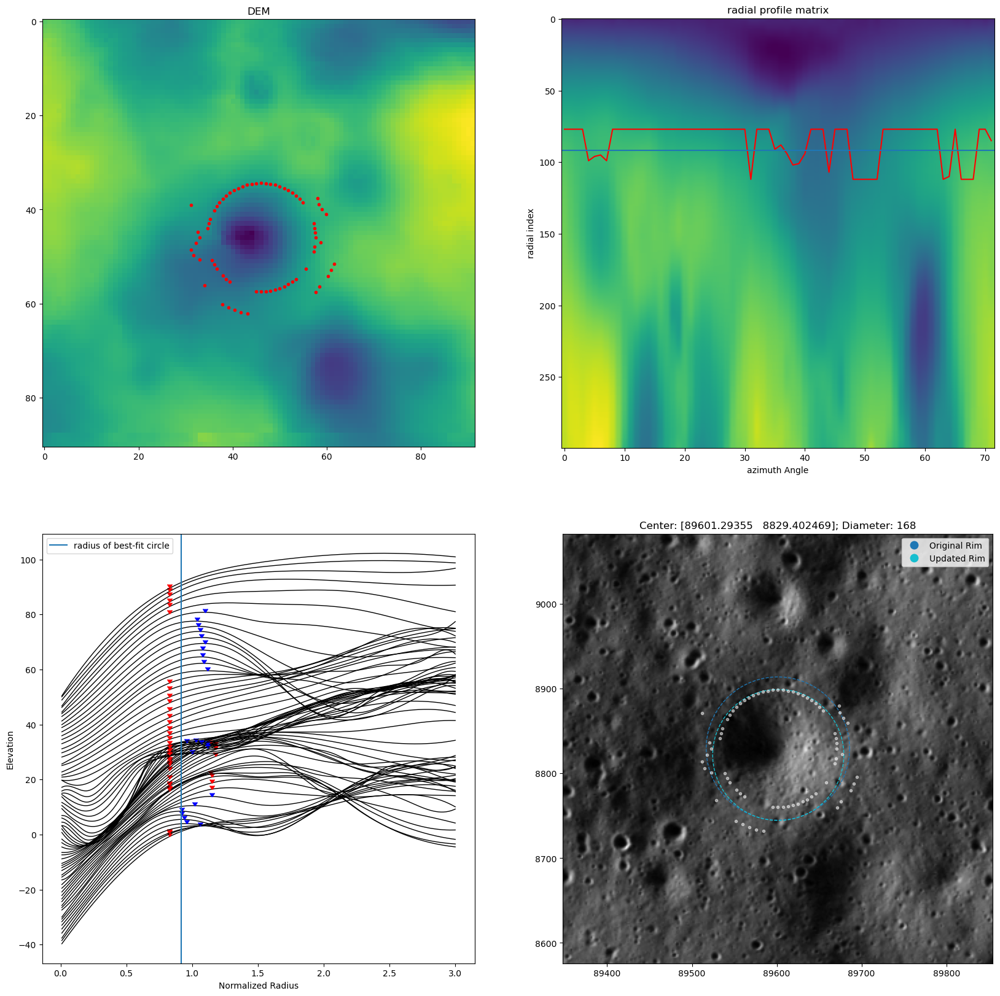

8380.600051999996, 89814.57461999998
                                            geometry
0  POLYGON ((89968.433 8380.6, 89967.692 8365.519...
1  POLYGON ((89944.675 8375.152, 89943.996 8361.3...


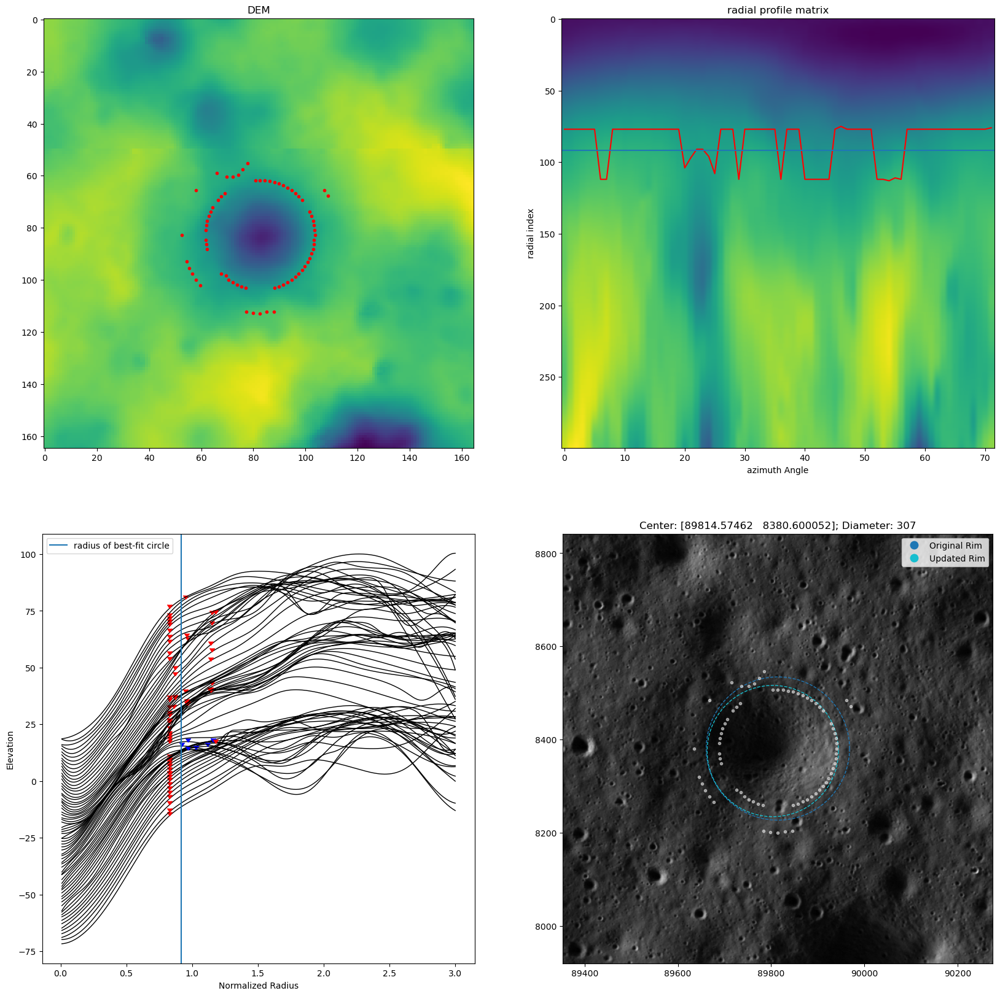

8199.254021999997, 90063.78259000002
                                            geometry
0  POLYGON ((90112.533 8199.254, 90112.298 8194.4...
1  POLYGON ((90112.288 8198.862, 90112.047 8193.9...


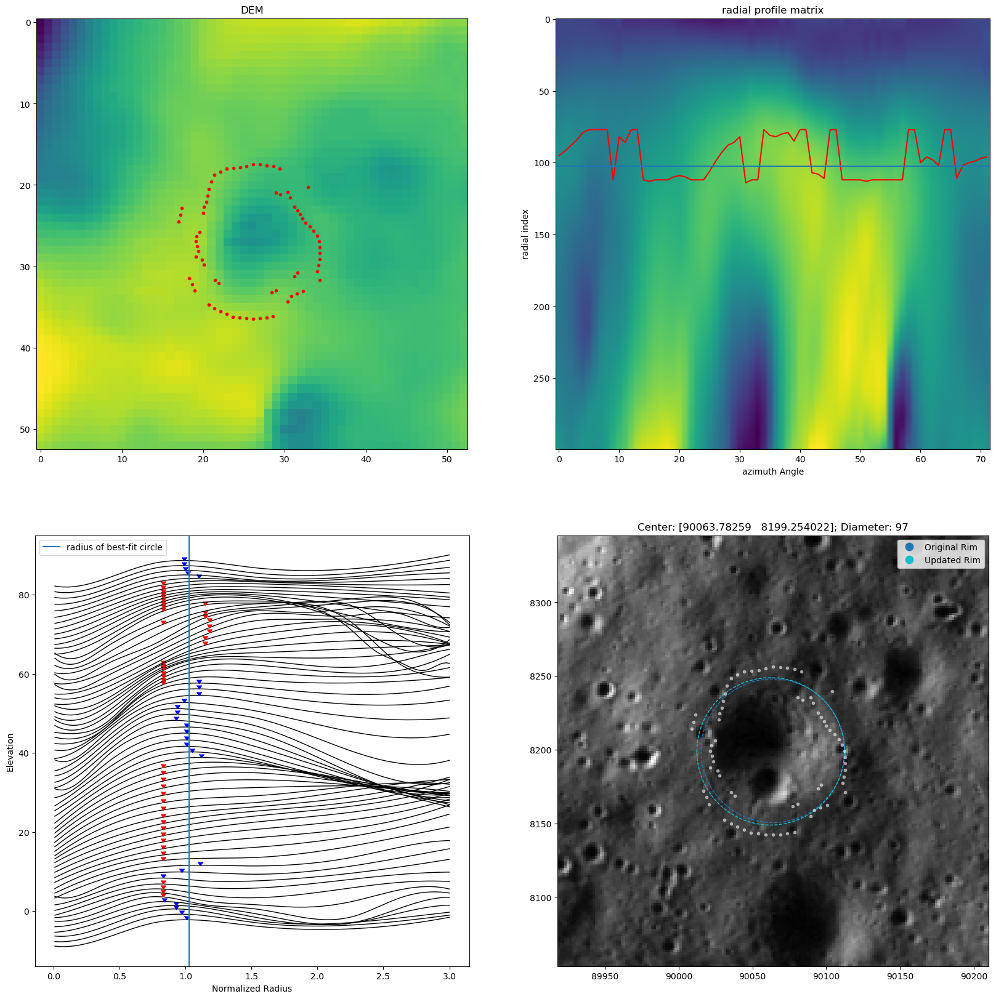

8070.372984999995, 90089.44473999996
                                            geometry
0  POLYGON ((90132.272 8070.373, 90132.065 8066.1...
1  POLYGON ((90134.241 8069.26, 90134.038 8065.11...


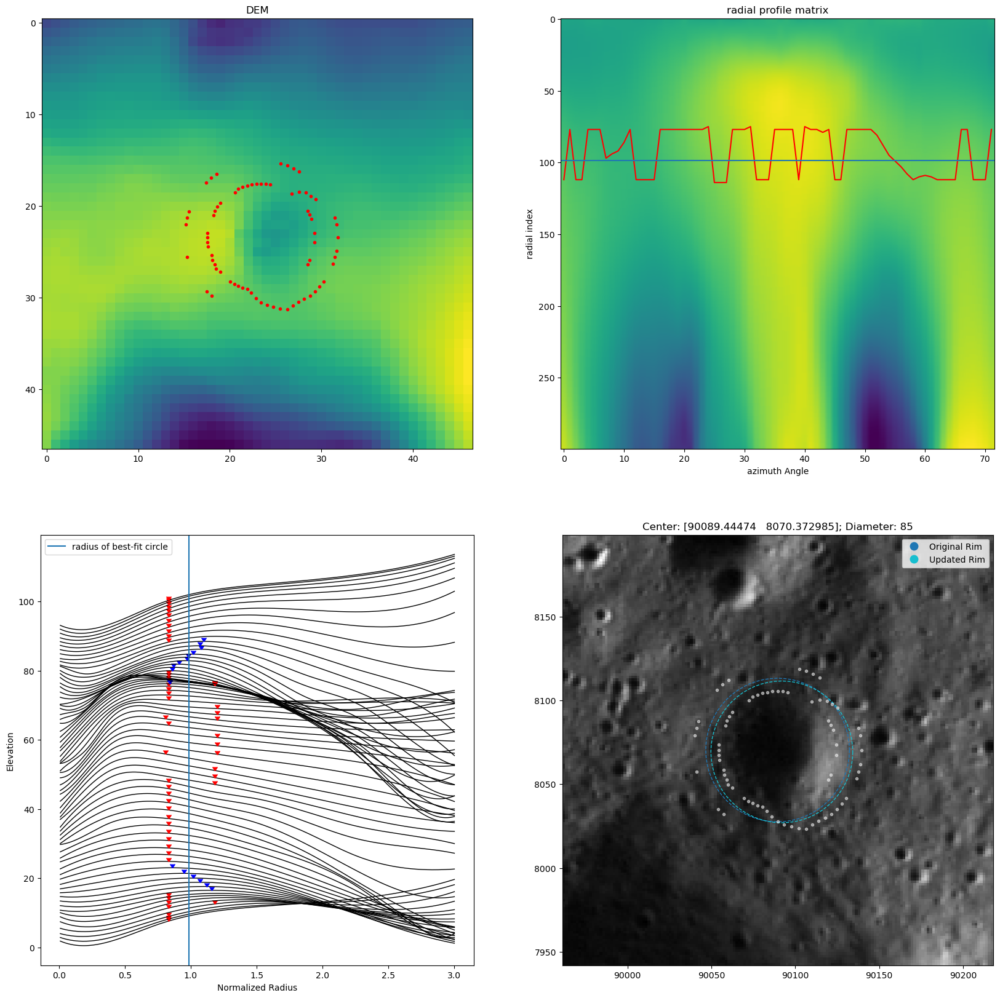

/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/cratools.py:330: UserWarning: 
A theoretically impossible result was found during the iteration
process for finding a smoothing spline with fp = s: s too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  spline1d = scipy.interpolate.UnivariateSpline(r, y, s=s, k=k)
/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/cratools.py:330: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  spline1d = scipy.interpolate.UnivariateSpline(r, y, s=s, k=k)


7857.092076000001, 90027.8558
                                            geometry
0  POLYGON ((90211.253 7857.092, 90210.37 7839.11...
1  POLYGON ((90208.793 7824.234, 90207.903 7806.1...


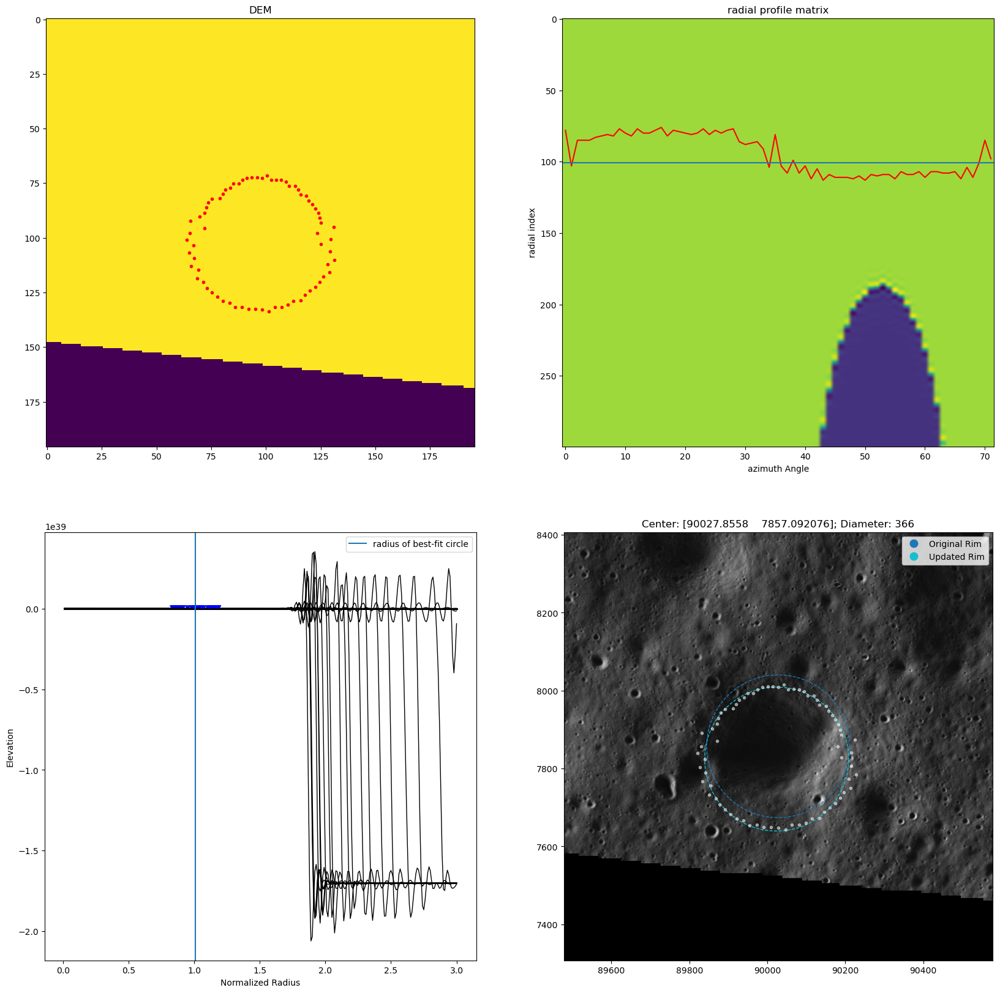

/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/cratools.py:330: UserWarning: 
A theoretically impossible result was found during the iteration
process for finding a smoothing spline with fp = s: s too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  spline1d = scipy.interpolate.UnivariateSpline(r, y, s=s, k=k)


7678.597497999997, 90341.50408999997
                                            geometry
0  POLYGON ((90430.789 7678.597, 90430.359 7669.8...
1  POLYGON ((90427.451 7668.834, 90427.031 7660.2...


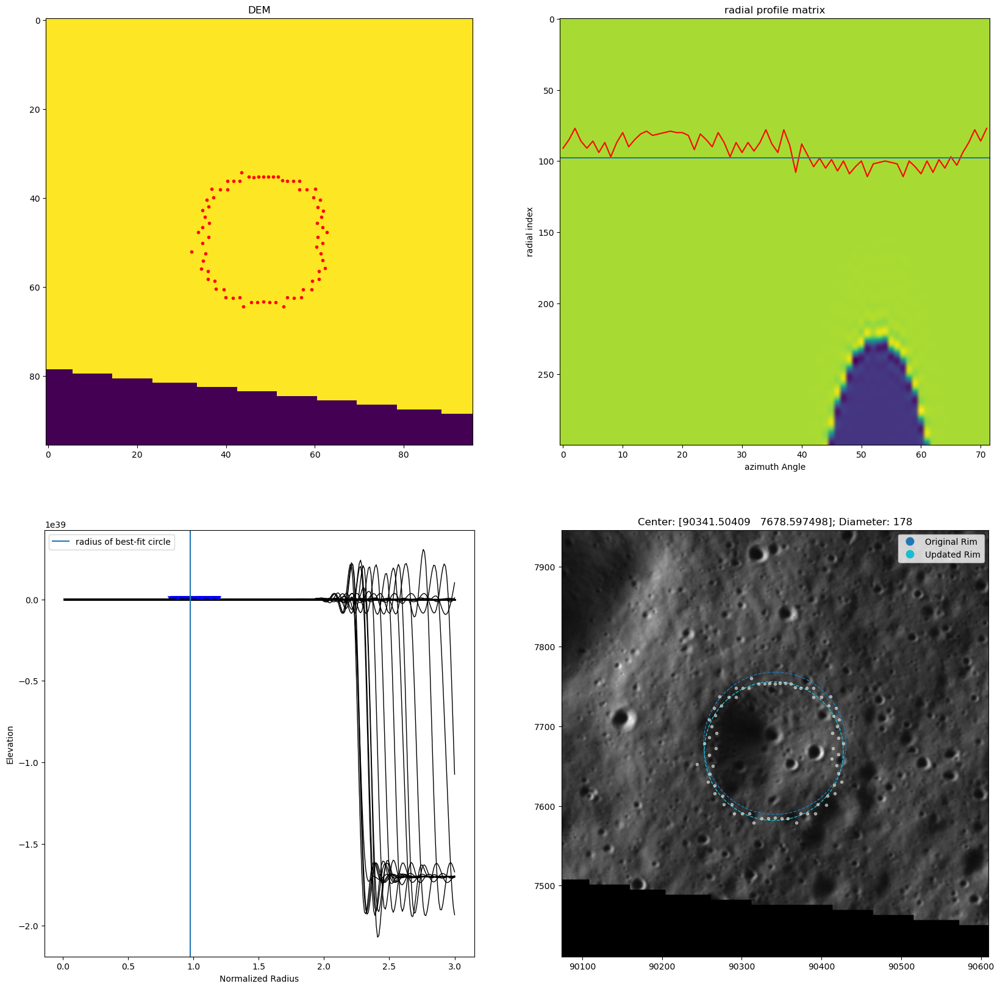

Residuals are not finite in the initial point.
7781.2460719999945, 89798.03672999993
                                            geometry
0  POLYGON ((89853.16 7781.246, 89852.894 7775.84...
1  POLYGON ((89842.1 7781.246, 89841.887 7776.927...


/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/cratools.py:283: RuntimeWarning: Mean of empty slice
  [a, b, c] = [np.nanmean(E_rim), 0.0, 0.0]


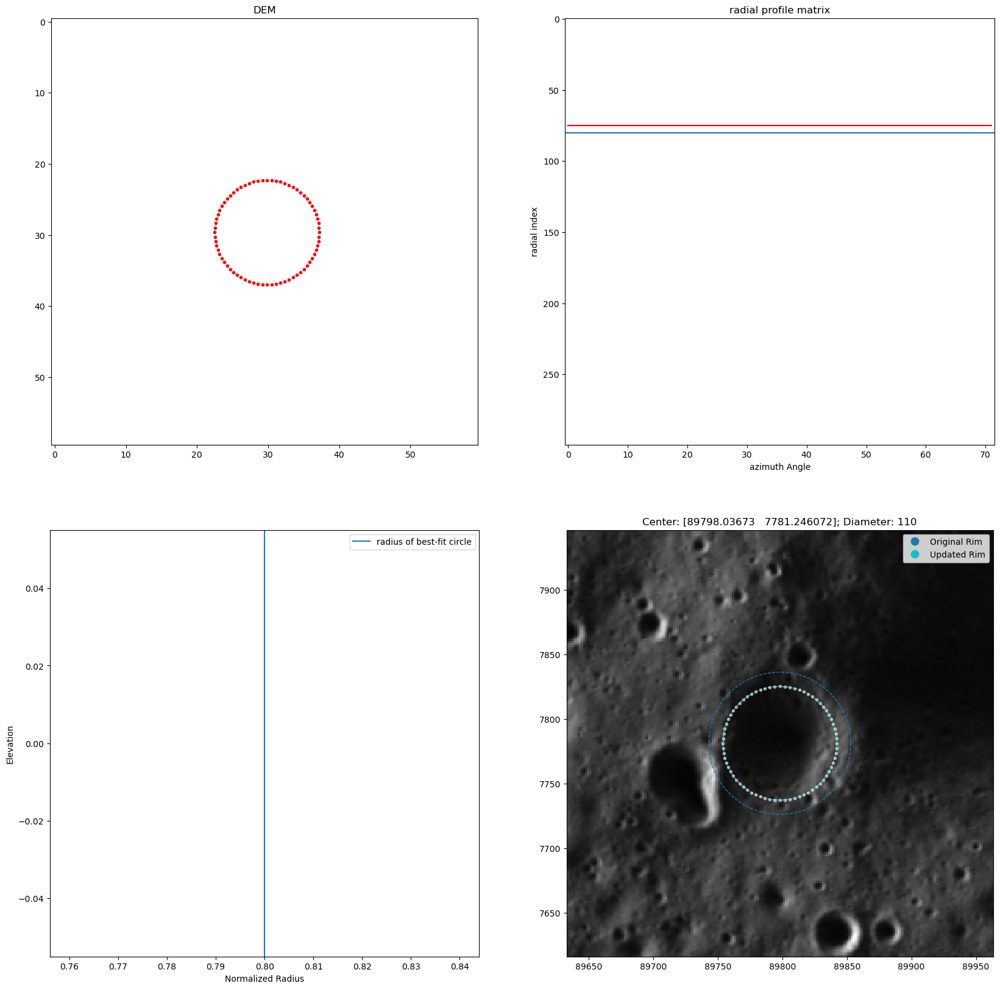

9188.152009999996, 89872.13832999994
                                            geometry
0  POLYGON ((90020.095 9188.152, 90019.382 9173.6...
1  POLYGON ((90040.324 9190.905, 90039.554 9175.2...


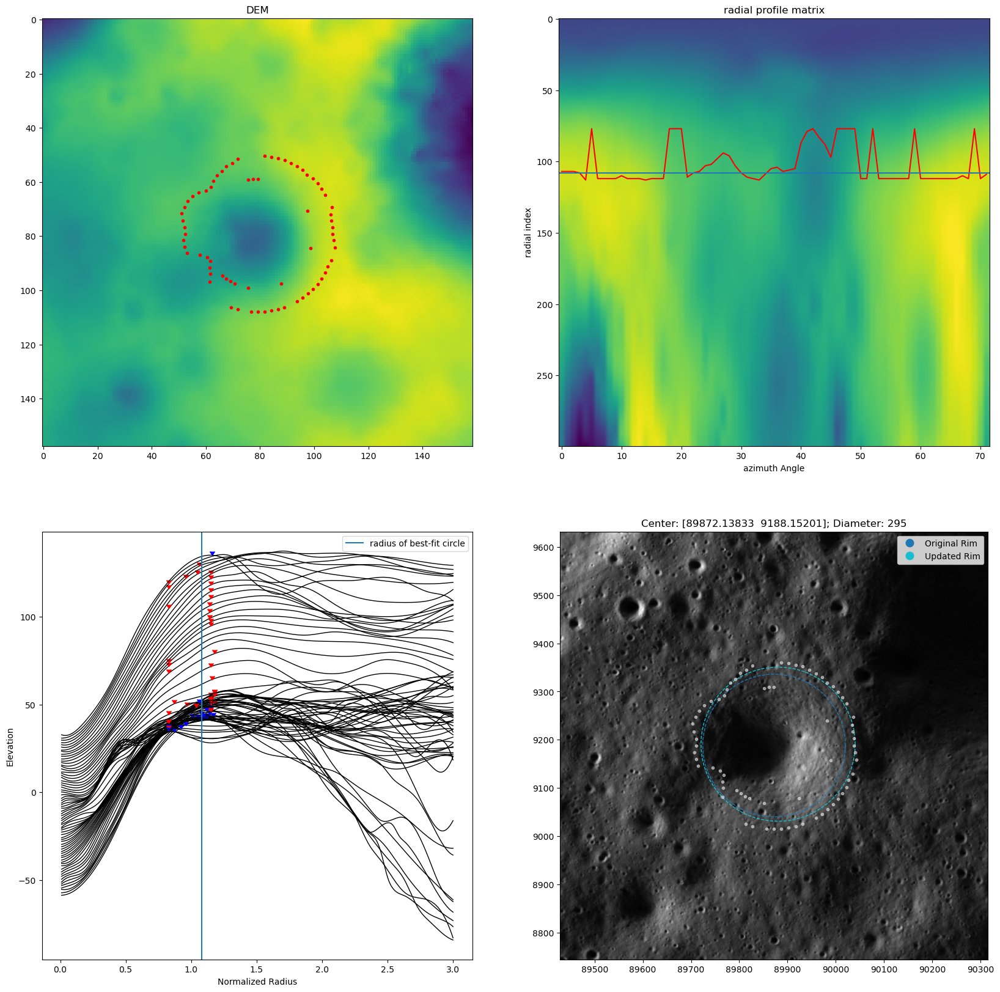

8860.926451999996, 90092.31609999998
                                            geometry
0  POLYGON ((90229.255 8860.926, 90228.595 8847.5...
1  POLYGON ((90230.881 8859.56, 90230.221 8846.11...


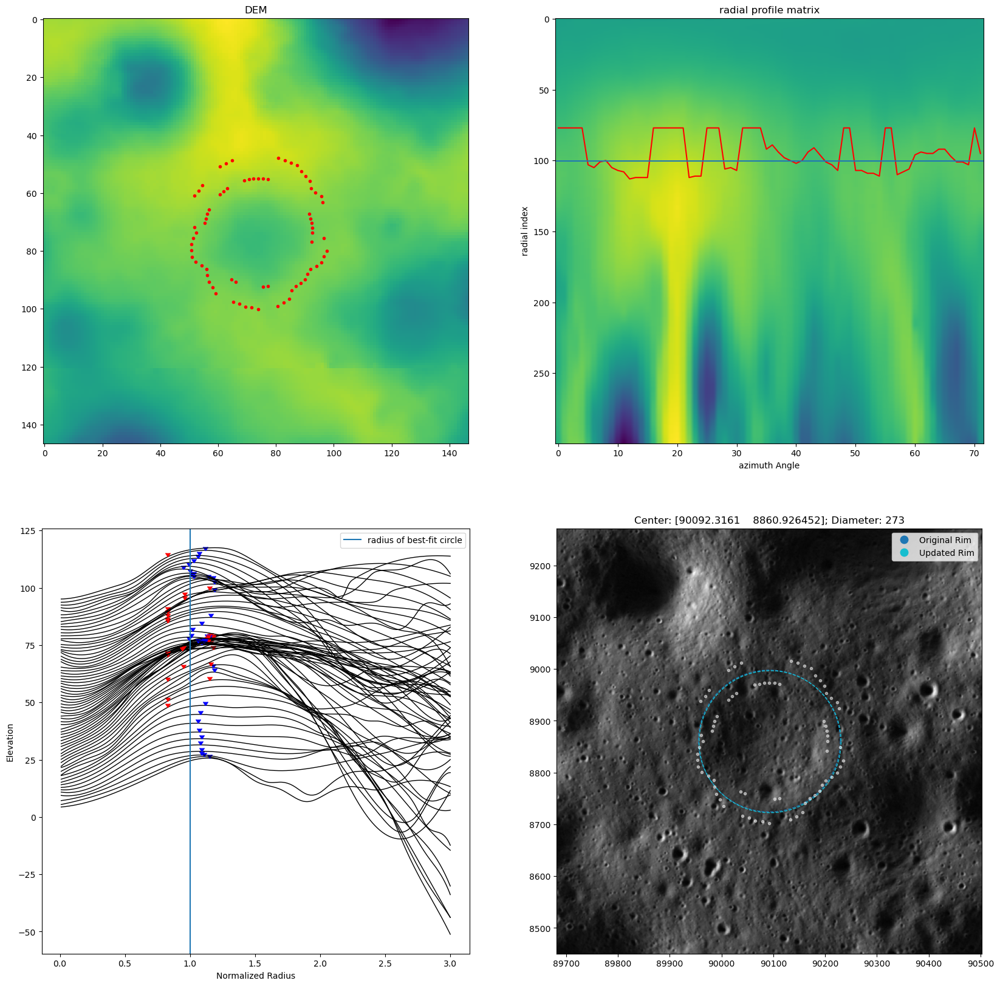

Residuals are not finite in the initial point.
10215.843560000003, 89893.87814000002
                                            geometry
0  POLYGON ((90014.341 10215.844, 90013.761 10204...
1  POLYGON ((89990.171 10215.844, 89989.707 10206...


/Users/asonke/Library/CloudStorage/OneDrive-ArizonaStateUniversity/SLC/cratools.py:283: RuntimeWarning: Mean of empty slice
  [a, b, c] = [np.nanmean(E_rim), 0.0, 0.0]


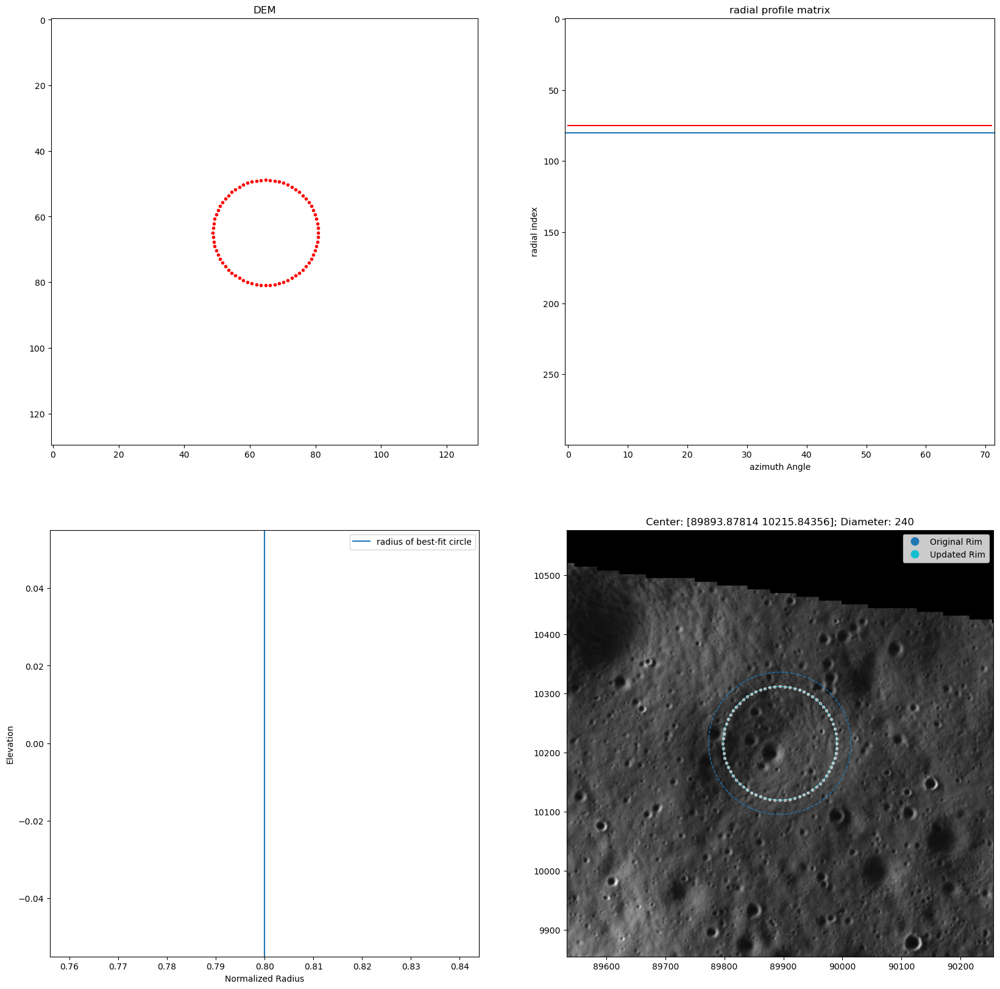

9490.604070000003, 89554.59395999997
                                            geometry
0  POLYGON ((89584.659 9490.604, 89584.515 9487.6...
1  POLYGON ((89584.665 9489.486, 89584.519 9486.5...


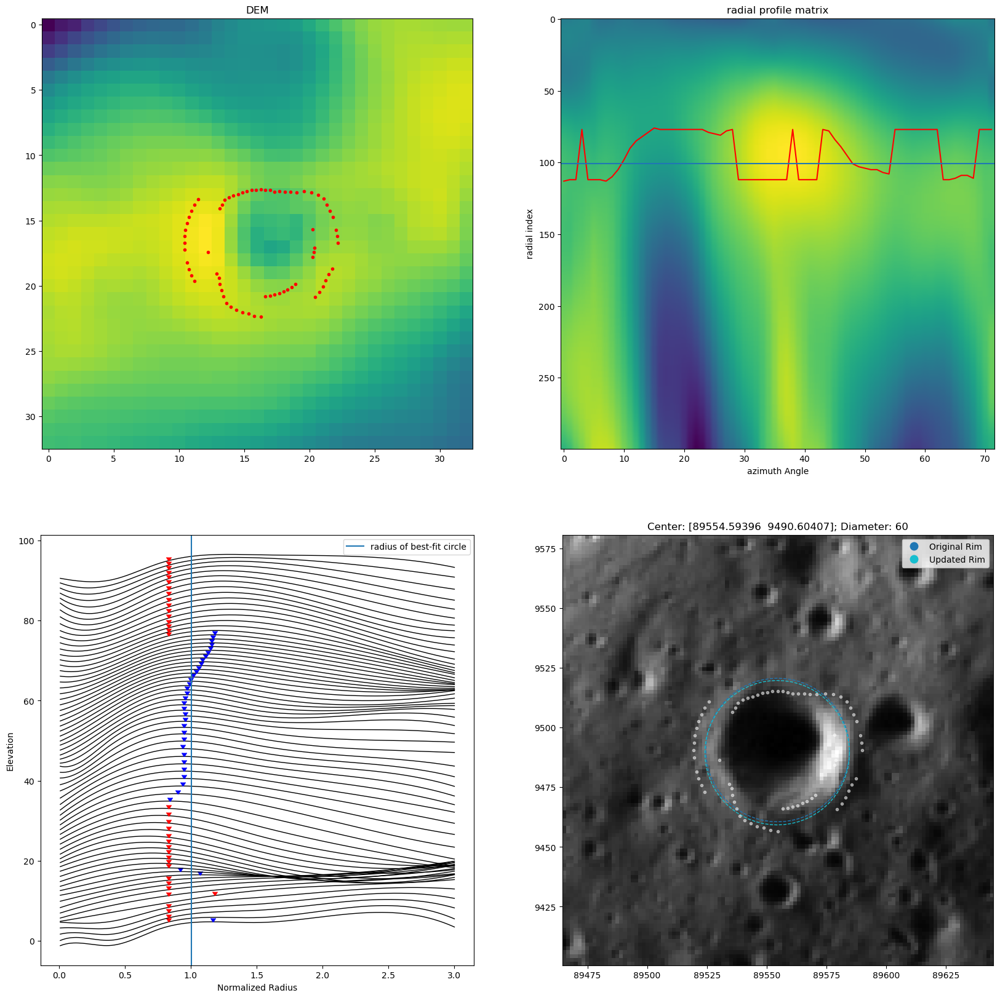

9727.631049, 90054.86764000001
                                            geometry
0  POLYGON ((90167.39 9727.631, 90166.848 9716.60...
1  POLYGON ((90165.867 9718.639, 90165.344 9707.9...


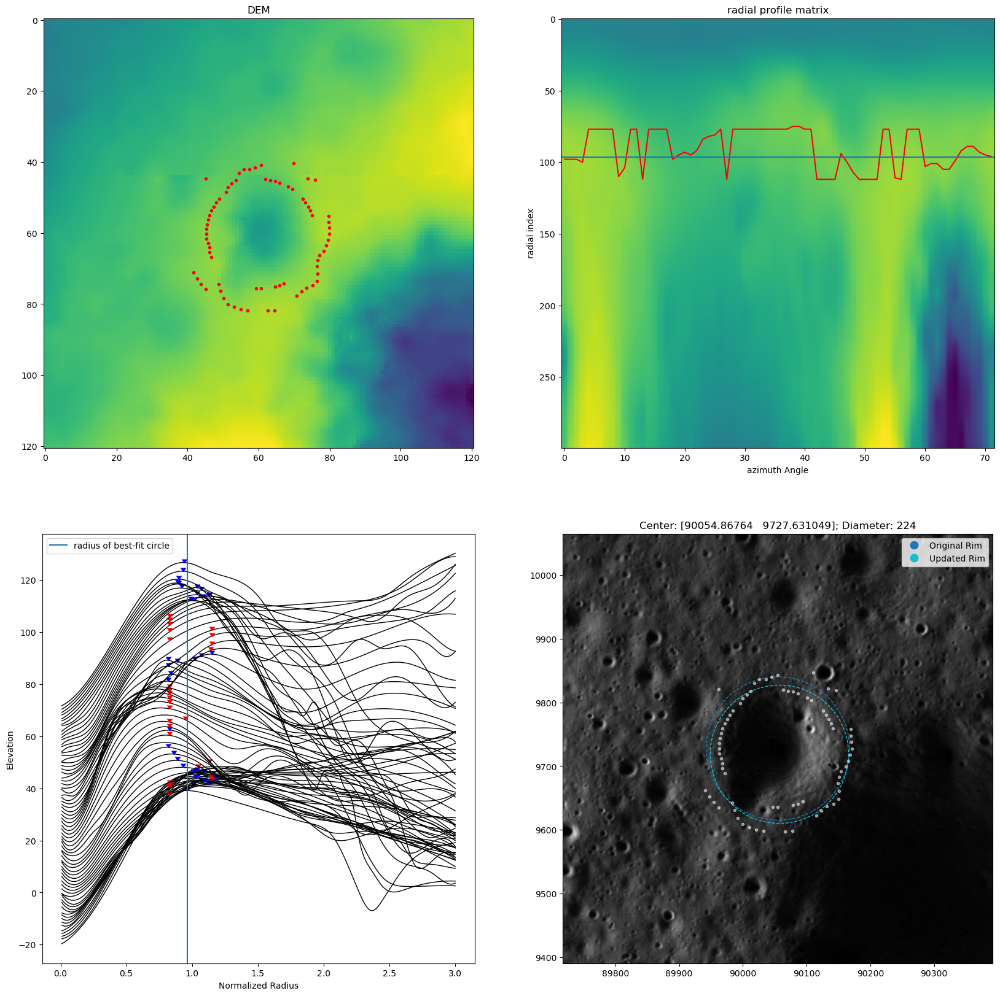

9500.567592, 89676.77817999998
                                            geometry
0  POLYGON ((89717.728 9500.568, 89717.531 9496.5...
1  POLYGON ((89716.177 9503.271, 89715.982 9499.3...


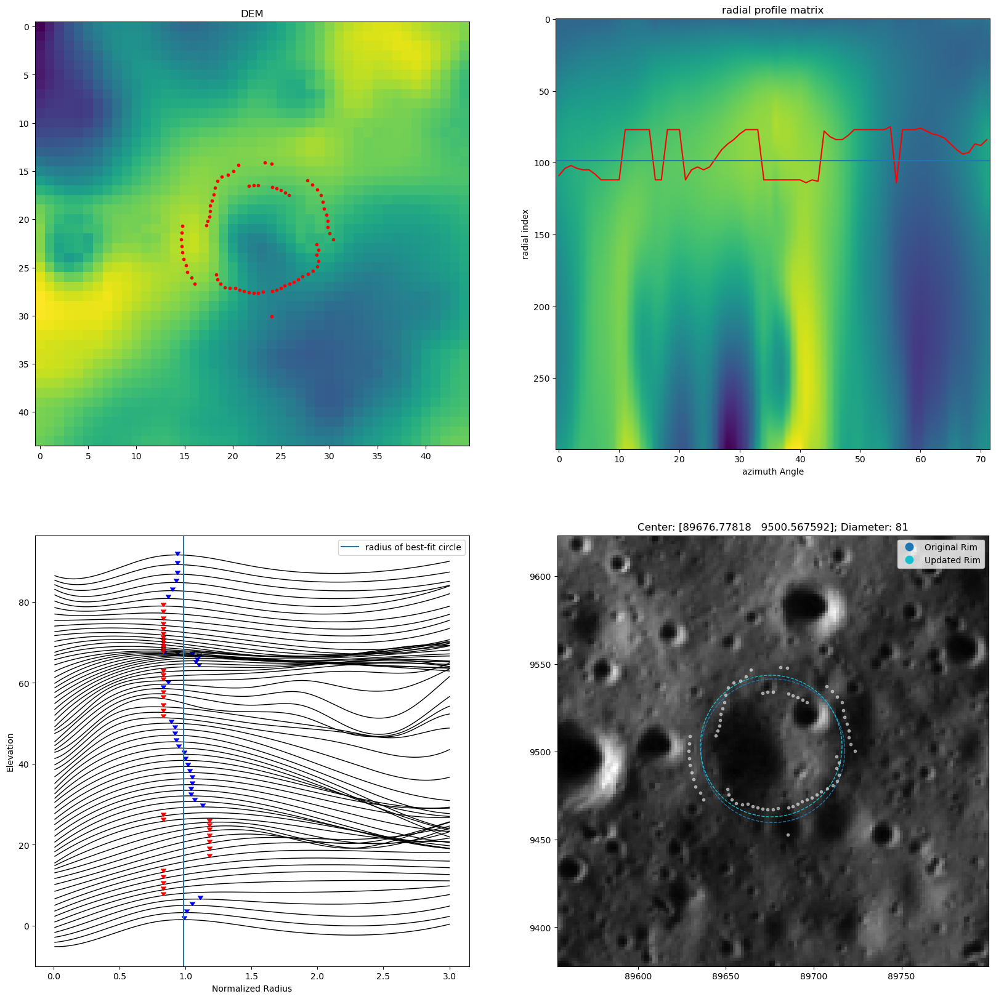

9940.535693000002, 89720.30303999997
                                            geometry
0  POLYGON ((89761.56 9940.536, 89761.362 9936.49...
1  POLYGON ((89763.568 9940.525, 89763.368 9936.4...


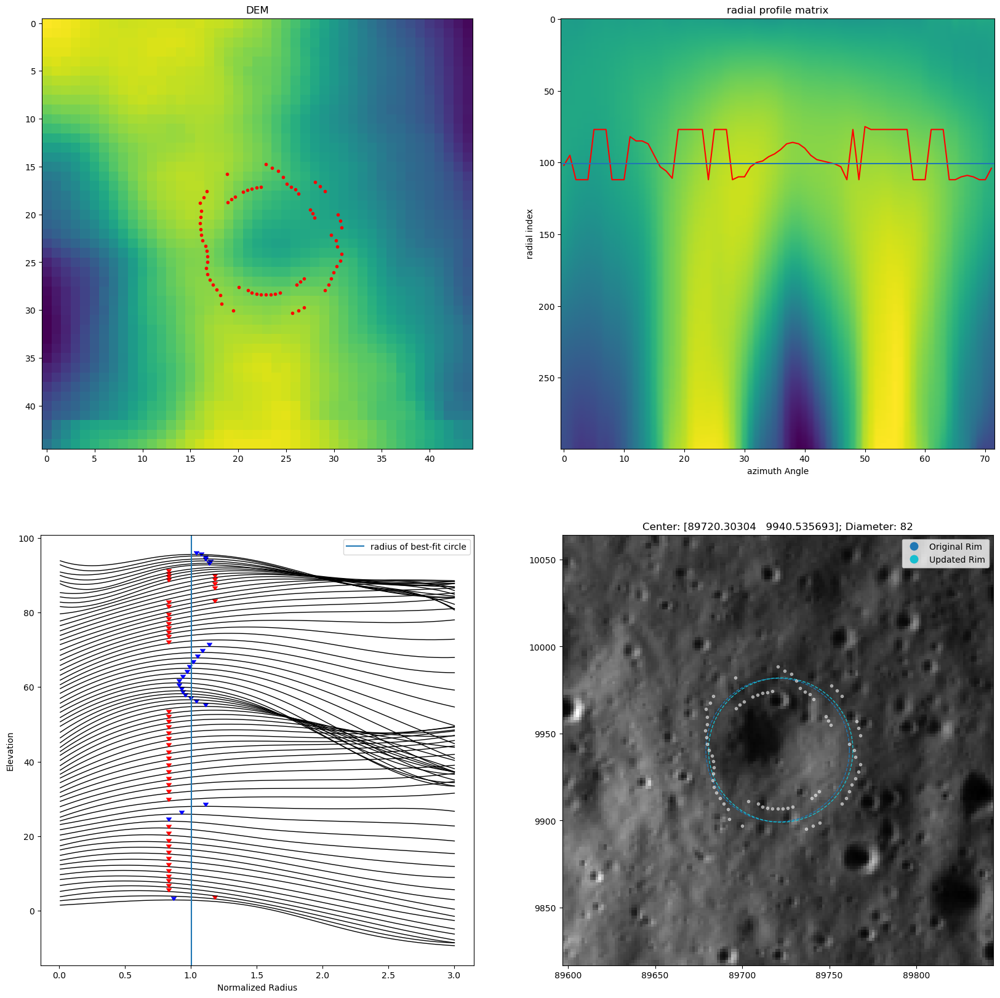

9657.886337999995, 89856.12155999994
                                            geometry
0  POLYGON ((89886.314 9657.886, 89886.169 9654.9...
1  POLYGON ((89885.143 9657.216, 89885.001 9654.3...


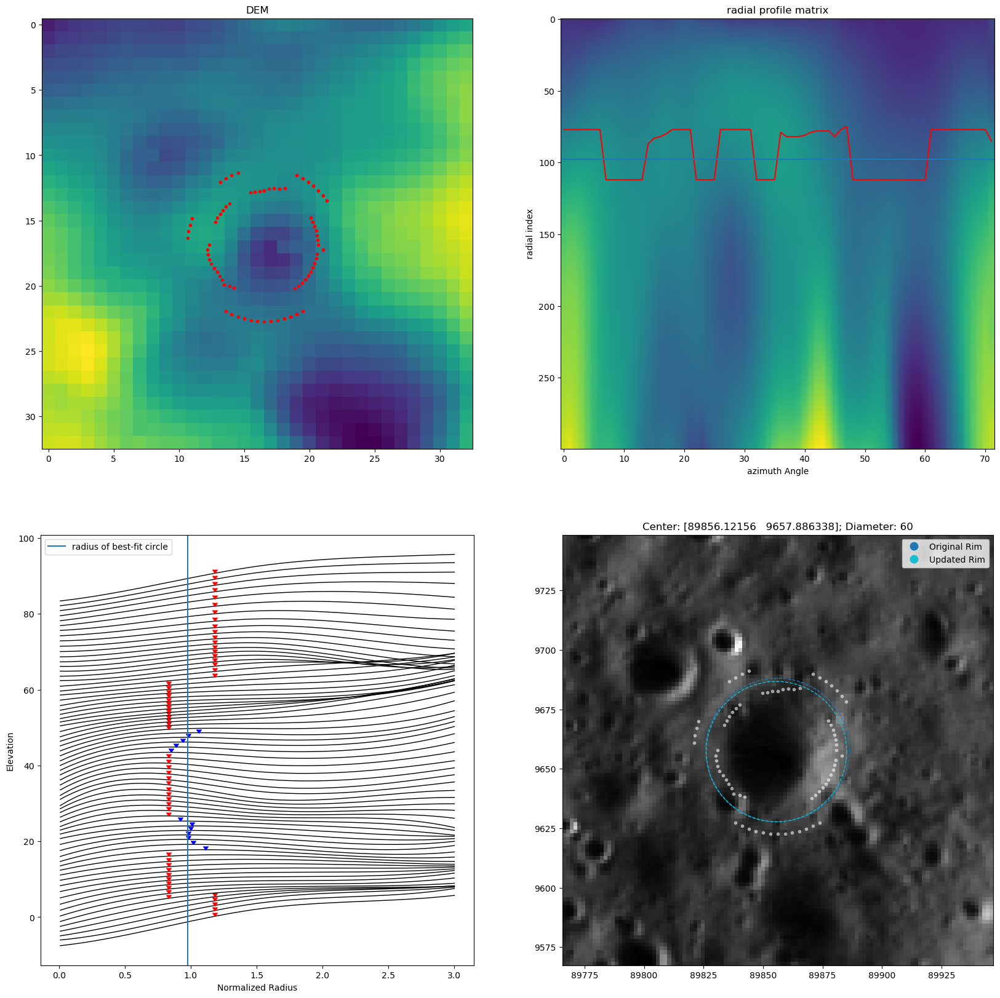

9016.427980000002, 89594.21237000001
                                            geometry
0  POLYGON ((89631.962 9016.428, 89631.781 9012.7...
1  POLYGON ((89631.531 9017.576, 89631.357 9014.0...


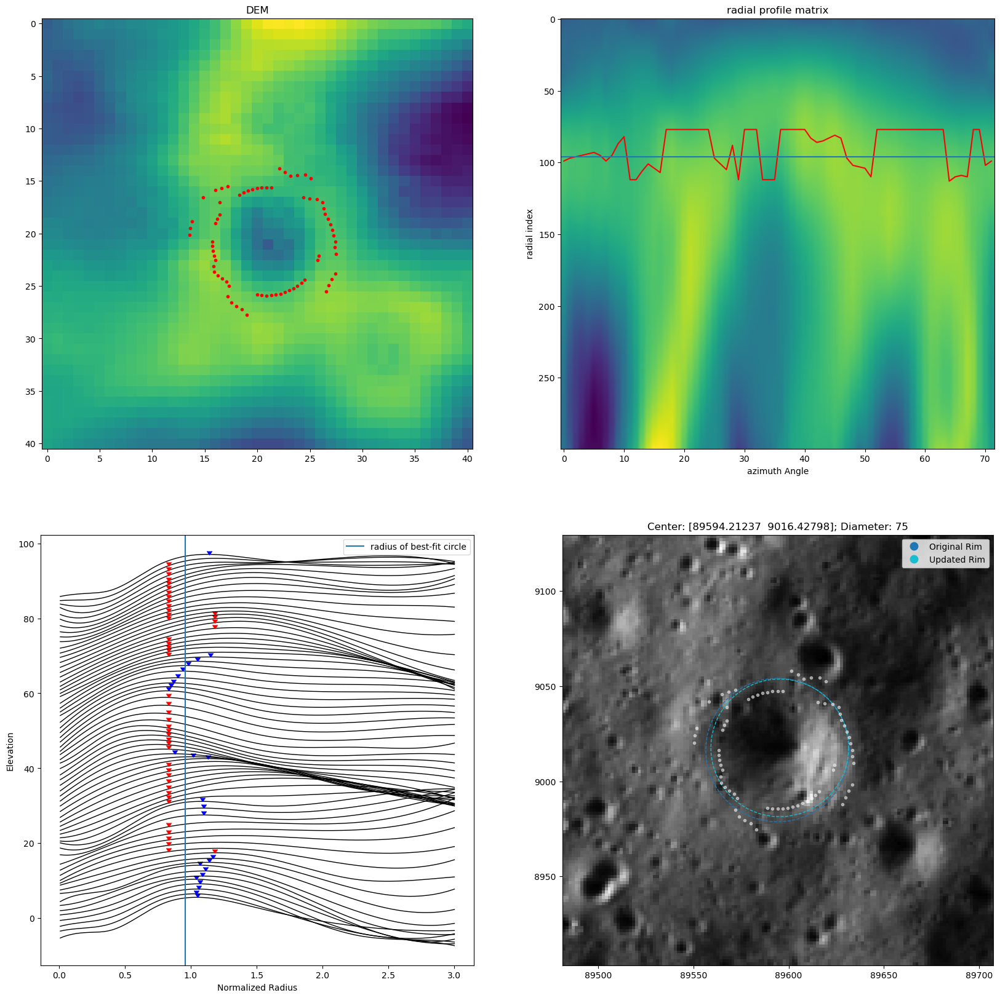

10043.008160000007, 90193.6009
                                            geometry
0  POLYGON ((90235.705 10043.008, 90235.502 10038...
1  POLYGON ((90234.643 10041.645, 90234.45 10037....


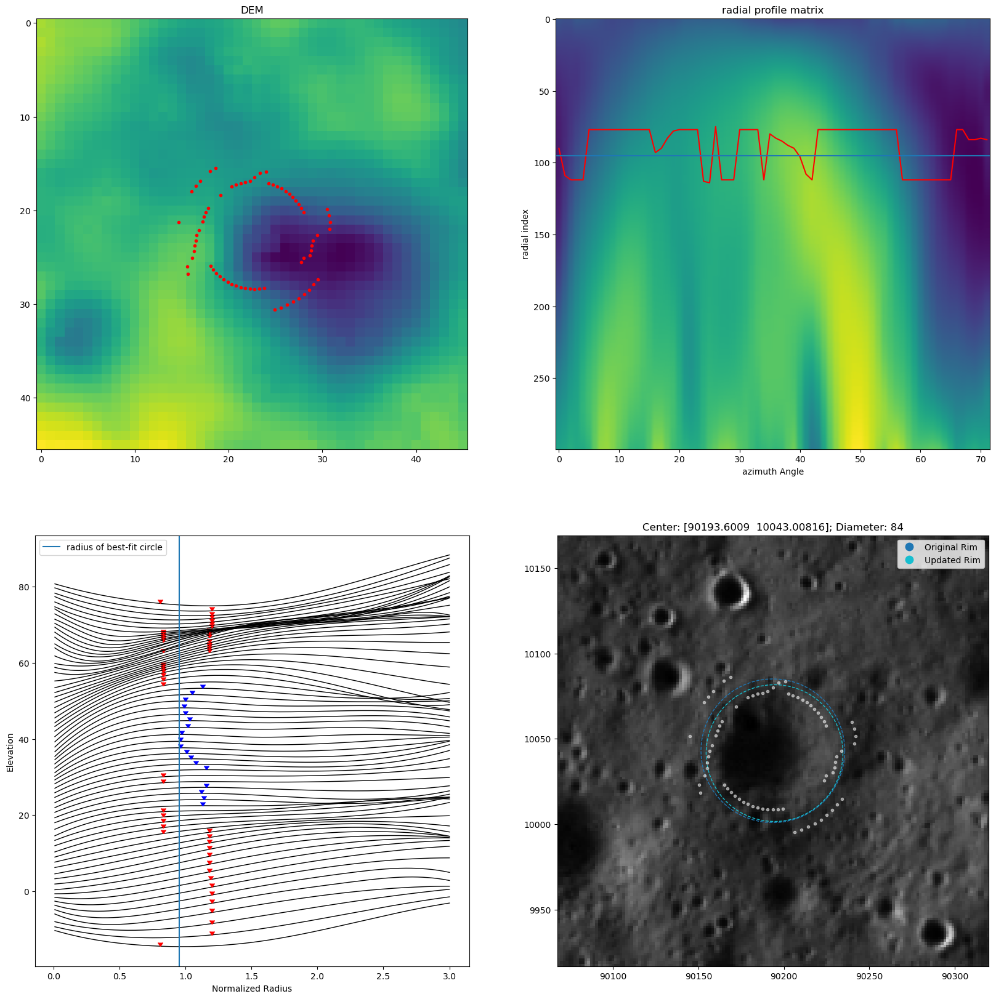

9981.677387000003, 90078.50695999998
                                            geometry
0  POLYGON ((90118.179 9981.677, 90117.988 9977.7...
1  POLYGON ((90118.494 9983.417, 90118.314 9979.7...


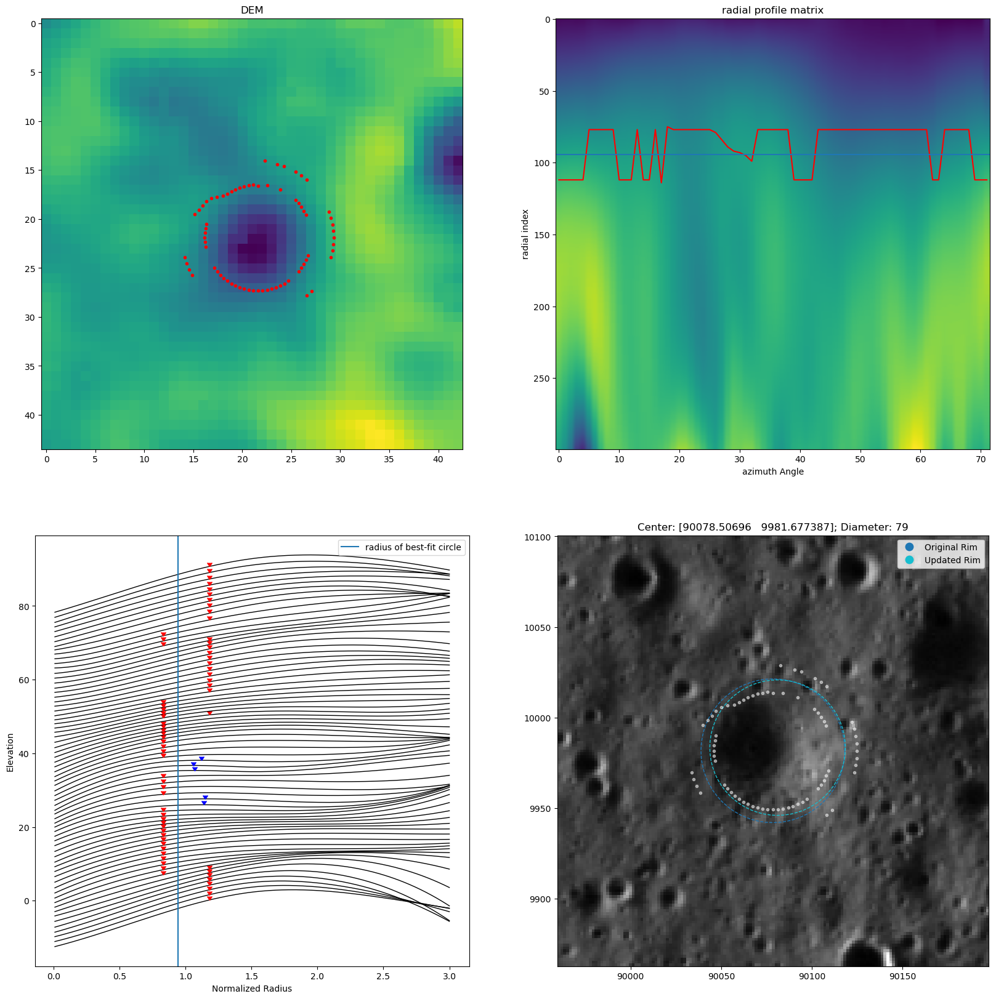

8892.753084999995, 89736.61111999996
                                            geometry
0  POLYGON ((89802.58 8892.753, 89802.262 8886.28...
1  POLYGON ((89803.261 8887.441, 89802.946 8881.0...


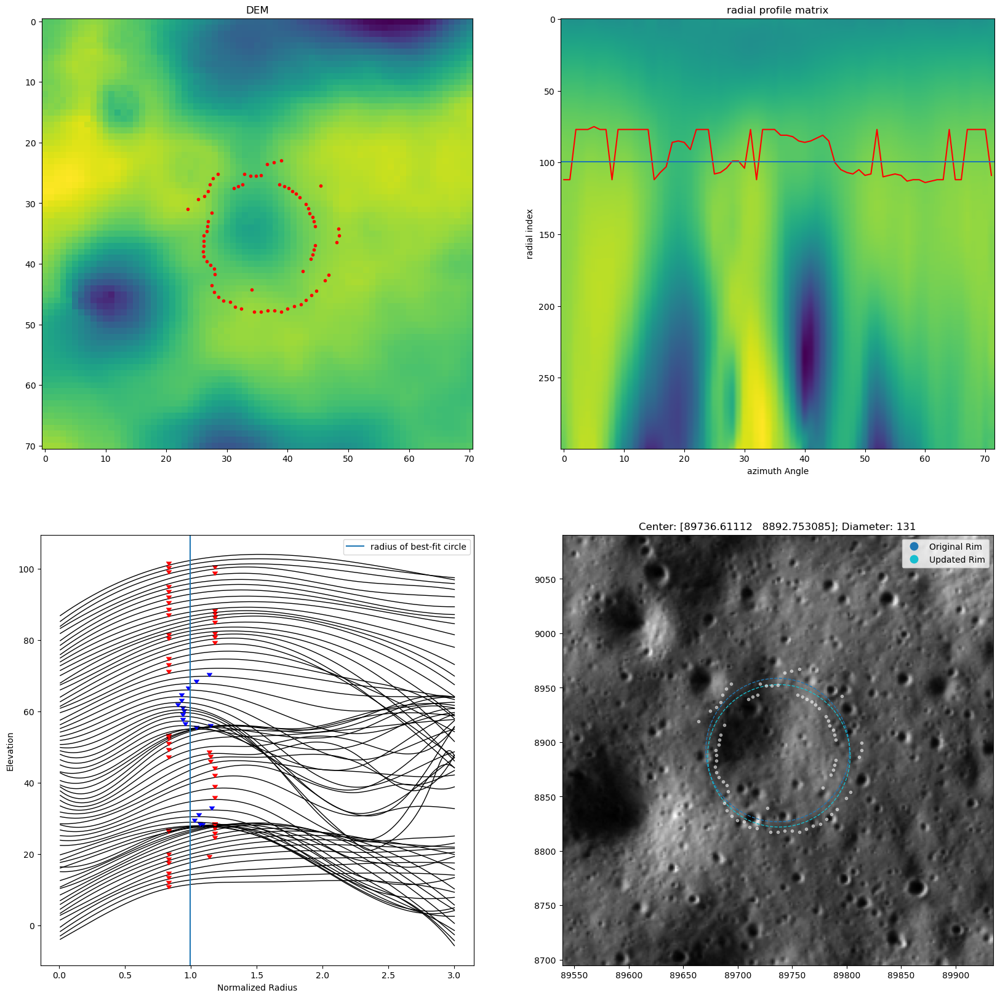

,geometry,UFID,Diam_m,davg,old_dD,rim_AJS,fl_AJS,err_x0,err_y0,err_r
0,"POLYGON ((89679.115 8821.8, 89678.742 8814.217...",p003c2322,169.114867,8.643539,0.051110,0.025231,-8.618308,7.563384,7.854485,5.458744
1,"POLYGON ((89944.675 8375.152, 89943.996 8361.3...",p003c2323,307.717374,13.144318,0.042716,-1.869000,-15.013318,14.204863,13.796716,9.905762
2,"POLYGON ((90112.288 8198.862, 90112.047 8193.9...",p003c2324,97.500408,3.120705,0.032007,0.915724,-2.204981,4.169885,3.770970,2.796505
3,"POLYGON ((90134.241 8069.26, 90134.038 8065.11...",p003c2325,85.653549,3.574827,0.041736,2.606802,-0.968024,3.602275,3.631242,2.554007
4,"POLYGON ((90208.793 7824.234, 90207.903 7806.1...",p003c2326,366.794230,21.495814,0.058605,1.684293,-19.811522,15.114015,15.284057,10.790174
5,"POLYGON ((90427.451 7668.834, 90427.031 7660.2...",p003c2327,178.569540,7.443768,0.041686,2.331132,-5.112636,7.717300,7.525726,5.396322
6,"POLYGON ((89842.1 7781.246, 89841.887 7776.927...",p003c2328,110.245561,4.276311,0.038789,1.744201,-2.532109,5.737345,5.737345,4.056915
7,"POLYGON ((90040.324 9190.905, 90039.554 9175.2...",p003c2344,295.912638,17.204033,0.058139,3.949626,-13.254407,11.359545,11.449394,8.060667
8,"POLYGON ((90230.881 8859.56, 90230.221 8846.11...",p003c2349,273.876881,7.340993,0.026804,5.648157,-1.692836,11.610042,11.163691,8.042886
9,"POLYGON ((89990.171 10215.844, 89989.707 10206...",p003c2446,240.926053,5.605634,0.023267,1.132537,-4.473098,12.538154,12.538154,8.865814


AttributeError: 'DatasetWriter' object has no attribute 'ndim'

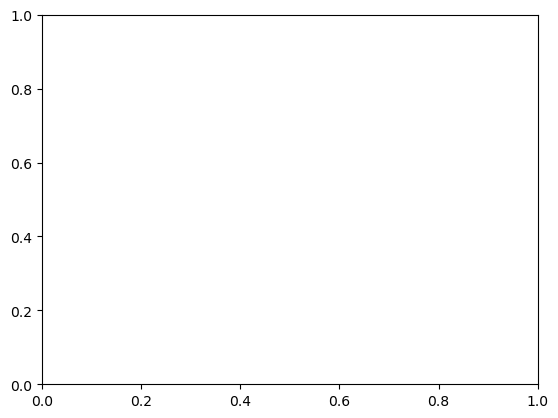

In [4]:

df = gpd.read_file(shapefile_path + ".shp")
df = df.drop(df[df['D_m'] <= min_D].index)
gdf = gpd.GeoDataFrame(df, geometry=df['geometry'])

gdf['geometry'] = gdf.geometry.buffer(gdf['D_m'] / 2)
gdf.to_file(shapefile_path + ".geom.shp")

in_shp=str(shapefile_path + ".geom.shp")

df_crater = gpd.read_file(in_shp)
display(df_crater[0:])

crs = df_crater.crs

for (idx,geom) in enumerate(df_crater['geometry']):
    radius = np.sqrt(geom.area / np.pi)
    diam = radius * 2


update_d_D(
   in_shp=(shapefile_path + ".geom.shp"),
   out_shp=(shapefile_path + ".refined.shp")
)

# d/D Function

In [ ]:
# takes the refined crater rims and produces quantitative crater morphology metrics

def d_D_ratio_shp(infile, outfile, min_D = 60, DEM = filename_dem_full):
    df = gpd.read_file(infile)
    crs = df.crs
    dd_rats_no = []
    diams_no = []
    depths_no = []
    rims_no = []
    floors_no = []
    for (idx, crater) in enumerate(df['geometry']):

        radius = np.sqrt(crater.area / np.pi)
        diam = radius * 2

        # if diam < min_D:
        #     continue
        r_err = df['err_r'][idx]
        rat, dep, dia, rim, floor = cratools.compute_depth_diameter_ratio(geom = crater, 
                                                     filename_dem = filename_dem_full,
                                                     crs = crs,
                                                     orthophoto = orthophoto_path,
                                                     diam_err = 2 * r_err,
                                                     remove_ext=True,
                                                     plot = True,
                                                     )
        dd_rats_no.append(rat)
        diams_no.append(dia)
        depths_no.append(dep)
        rims_no.append(rim)
        floors_no.append(floor)

    dd_no = np.array(dd_rats_no)


    dd_nom_no = unumpy.nominal_values(dd_no)
    dd_err_no = unumpy.std_devs(dd_no)

    dep_nom_no = unumpy.nominal_values(depths_no)
    dep_err_no = unumpy.std_devs(depths_no)

    diams_no = unumpy.nominal_values(diams_no)

    rims_no = unumpy.nominal_values(rims_no)
    floors_no = unumpy.nominal_values(floors_no)


    df['diam'] = diams_no
    df['d_D'] = dd_nom_no
    df['d_D_err'] = dd_err_no
    df['depth'] = dep_nom_no
    df['depth_err'] = dep_err_no
    df['rim_JKA'] = rims_no
    df['floor_JKA'] = floors_no

    #display(df)
    df.to_file(outfile)

    return df_crater

In [ ]:
d_D_ratio_shp(
            infile = (shapefile_path + ".refined.shp"),
              outfile = (shapefile_path + ".data.shp")
)